# Legal Studies 123 Problem Set 1: San Francisco Crime - Descriptive Statistics and Geographic Visualization
### Maggie Siu (3034195506)
### March 5, 2021

In [1]:
# install required libraries
#!pip install numpy
#!pip install pandas
#!pip install geopandas
#!pip install folium
#!pip install rasterio

# import libraries

import numpy as np
import pandas as pd
import folium
import folium.plugins as plugins
import geopandas as gpd
import json
import os
import rasterio
from folium.plugins import MarkerCluster
from branca.colormap import linear
import branca.colormap
from collections import Counter
from scipy import stats
import statsmodels.api as sm
from sklearn import datasets, linear_model
from sklearn.linear_model import LinearRegression
%matplotlib inline
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.pyplot as plots
plots.style.use('fivethirtyeight')

### Import and Clean Dataset

In [2]:
df = pd.read_csv('Police_Department_Incident_Reports__Historical_2003_to_May_2018.csv')
df.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,150060275,NON-CRIMINAL,LOST PROPERTY,Monday,01/19/2015,14:00,MISSION,NONE,18TH ST / VALENCIA ST,-122.421582,37.761701,"(37.7617007179518, -122.42158168137)",15006027571000
1,150098210,ROBBERY,"ROBBERY, BODILY FORCE",Sunday,02/01/2015,15:45,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,"(37.7841907151119, -122.414406029855)",15009821003074
2,150098210,ASSAULT,AGGRAVATED ASSAULT WITH BODILY FORCE,Sunday,02/01/2015,15:45,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,"(37.7841907151119, -122.414406029855)",15009821004014
3,150098210,SECONDARY CODES,DOMESTIC VIOLENCE,Sunday,02/01/2015,15:45,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,"(37.7841907151119, -122.414406029855)",15009821015200
4,150098226,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Tuesday,01/27/2015,19:00,NORTHERN,NONE,LOMBARD ST / LAGUNA ST,-122.431119,37.800469,"(37.8004687042875, -122.431118543788)",15009822628160


In [3]:
#Convert Date to datetime
df['Date'] = pd.to_datetime(df['Date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2215024 entries, 0 to 2215023
Data columns (total 13 columns):
 #   Column      Dtype         
---  ------      -----         
 0   IncidntNum  int64         
 1   Category    object        
 2   Descript    object        
 3   DayOfWeek   object        
 4   Date        datetime64[ns]
 5   Time        object        
 6   PdDistrict  object        
 7   Resolution  object        
 8   Address     object        
 9   X           float64       
 10  Y           float64       
 11  Location    object        
 12  PdId        int64         
dtypes: datetime64[ns](1), float64(2), int64(2), object(8)
memory usage: 219.7+ MB


## 3 Descriptive Statistics

### 3.1 Plot number of incidents per year from 2003-2018:

In [4]:
#group by year and count number of incidents
crime_by_year = df['IncidntNum'].groupby([df['Date'].dt.year]).agg(['count'])
crime_by_year.rename(columns={"count": "Count"})

,Count
Date,
2003,149176
2004,148148
2005,142186
2006,137853
2007,137639
2008,141311
2009,139860
2010,133523
2011,132697


(<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>)

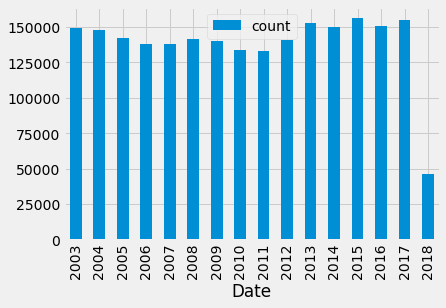

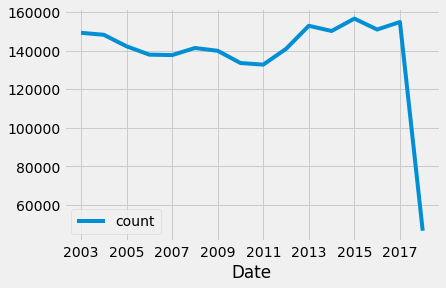

In [5]:
crime_by_year.plot.bar(), crime_by_year.plot.line(xticks=range(2003, 2019, 2))

Crimate rates have incrased in general. When we look at the graphs above, it mimics a suspension bridge. In 2003, it started at around 150,000 and around the year 2011 it reached a low point of about 130,000. However, when we look at the data from 2012-2017, we see a gradual increase in cases, breaking through the 150,000 mark and almost reaching 160,000 cases per year. To testify my predictions, I conducted some basic research on crime rates. Many articles online have stated that crime rates have been on a rise, espcially after the COVID-19 pandemic. In many cities, it has reached an all time high in decades, and I believe it is partly due to economic stagnation, soaring unemployment, and inequality.

### 3.2 Check whether relationshps change when looking at paticular type of crime:

Using year as the main category, the following dataframe allows us to compare the different types of crimes each year. We can see which type of crime is the most common each year and which is the least common.

In [6]:
crime_type_by_year = df.groupby([df['Date'].dt.year,'Category'])['IncidntNum'].agg(['count'])
crime_type_by_year

count
Date Category            
2003 ARSON            293
     ASSAULT        13461
     BAD CHECKS       134
     BRIBERY           28
     BURGLARY        6047
...                   ...
2018 TRESPASS         514
     VANDALISM       2796
     VEHICLE THEFT   1475
     WARRANTS        1618
     WEAPON LAWS      619

[609 rows x 1 columns]

Below are visualizations for the above dataframe:

In [7]:
#Reset index so the columns are callable.
crime_type_by_year = crime_type_by_year.reset_index()

#Pivot table to create the right formatting for visualization.
crime_type_by_year = crime_type_by_year.pivot(index='Date', columns='Category', values='count')
crime_type_by_year

Category,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,EMBEZZLEMENT,...,"SEX OFFENSES, NON FORCIBLE",STOLEN PROPERTY,SUICIDE,SUSPICIOUS OCC,TREA,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS
Date,,,,,,,,,,,,,,,,,,,,,
2003,293.0,13461.0,134.0,28.0,6047.0,886.0,289.0,9917.0,662.0,240.0,...,28.0,800.0,93.0,4196.0,NaN,1434.0,6448.0,15325.0,9079.0,1281.0
2004,280.0,12899.0,79.0,39.0,6753.0,814.0,244.0,9897.0,600.0,201.0,...,31.0,641.0,102.0,4489.0,NaN,1191.0,6496.0,17884.0,8114.0,1252.0
2005,231.0,11601.0,101.0,38.0,7071.0,687.0,196.0,8533.0,636.0,197.0,...,24.0,540.0,79.0,4693.0,NaN,1034.0,7013.0,18194.0,6708.0,1341.0
2006,240.0,12449.0,87.0,36.0,7004.0,521.0,266.0,9069.0,703.0,229.0,...,29.0,575.0,86.0,4775.0,NaN,1102.0,7688.0,7291.0,6498.0,1324.0
2007,246.0,12518.0,69.0,56.0,5454.0,581.0,313.0,10560.0,671.0,269.0,...,39.0,527.0,111.0,4800.0,NaN,1198.0,7566.0,6460.0,7105.0,1318.0
2008,248.0,12681.0,78.0,49.0,5679.0,789.0,408.0,11648.0,710.0,242.0,...,20.0,518.0,100.0,4751.0,NaN,1151.0,7342.0,6053.0,5798.0,1419.0
2009,222.0,12284.0,64.0,46.0,5379.0,956.0,579.0,11950.0,804.0,214.0,...,17.0,660.0,83.0,4627.0,NaN,1232.0,7604.0,5183.0,5764.0,1433.0
2010,209.0,12387.0,54.0,61.0,4966.0,827.0,458.0,9205.0,706.0,155.0,...,30.0,680.0,82.0,6004.0,2.0,1150.0,7934.0,4346.0,6187.0,1349.0
2011,203.0,12279.0,45.0,47.0,4987.0,762.0,470.0,6935.0,652.0,168.0,...,29.0,785.0,76.0,6207.0,NaN,1072.0,7243.0,4762.0,6311.0,1329.0


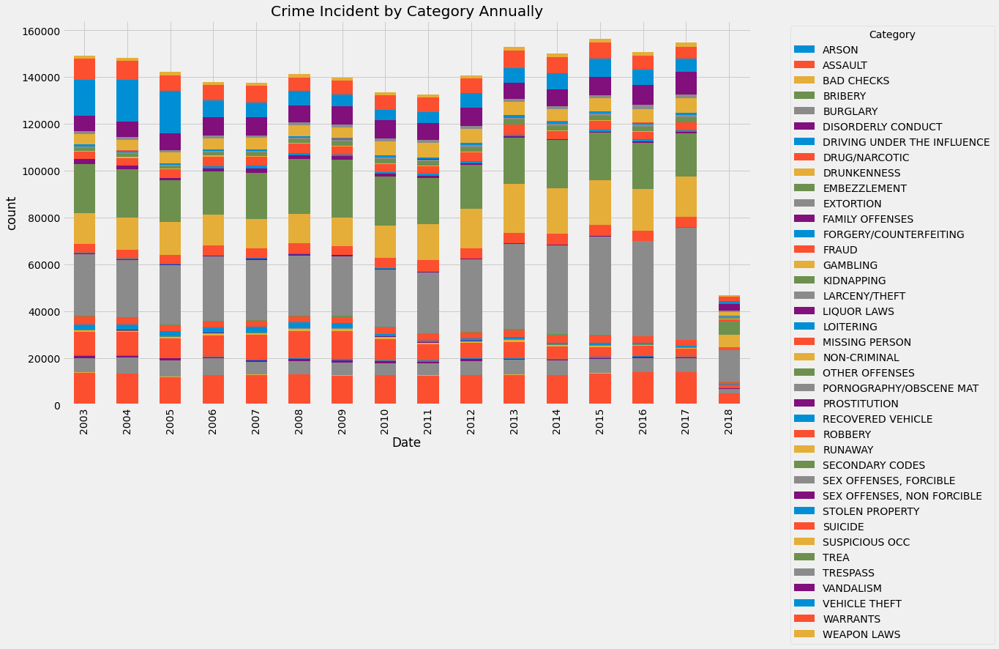

In [8]:
#Plot pivoted dataframe as a bar chart.
crime_type_by_year.plot.bar(stacked=True, figsize=(15, 9), ylabel='count', xlabel='Date', title='Crime Incident by Category Annually')
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

Using the stacked bar graph, we not only can see the total crime incidents each year, but also the total number of each crime type annually. Taking the 2017 bar, for example, we know that larceny/theft takes up the largest proportion of all crime types. 

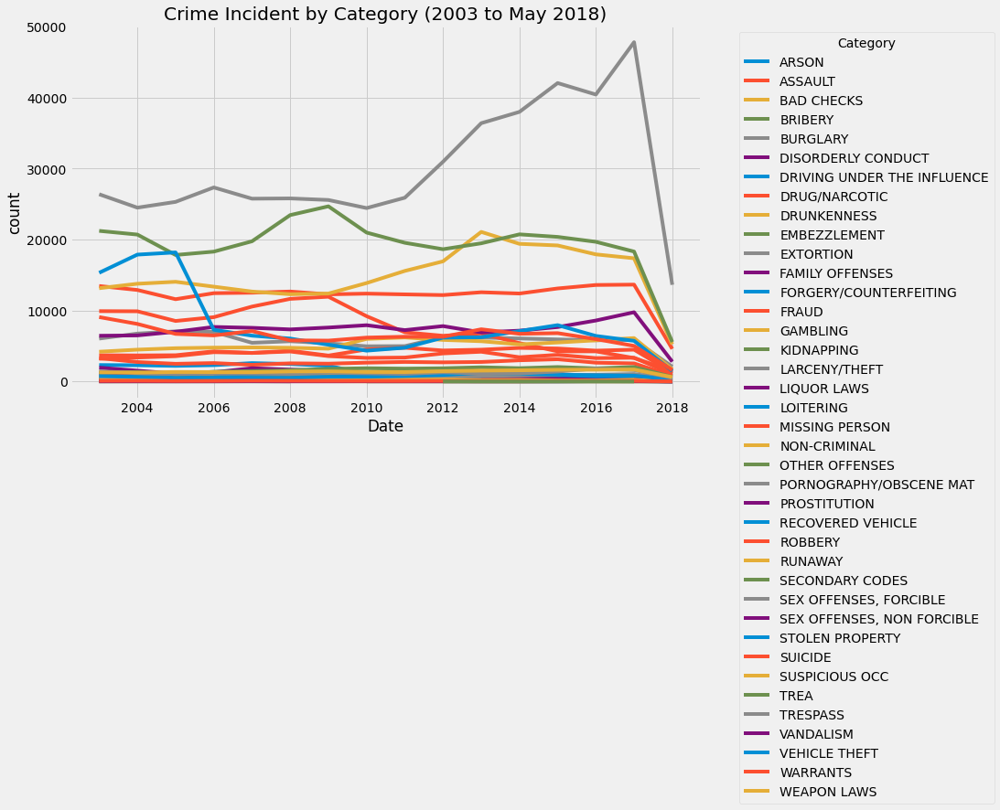

In [9]:
#Plot pivoted dataframe as a line graph.
crime_type_by_year.plot.line(figsize=(11, 7), ylabel='count', xlabel='Date', title='Crime Incident by Category (2003 to May 2018)')
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

The line graph doesn't provide us too much information on the specific categories of crimes because the concentrated lines and similar colors make it hard to decipher, but we can still spot the different trends of crime types over time, regardless whether we can see the different categories. For example, we know that there is a specific crime type, represented by the grey line, has been increasing over the years. We also know that there is a specific crime type, represented by the blue line, has greatly decreased since the year 2005. Even without knowing the exact categories, we can spot the overall trends and patterns.

The above dataframe and visualizations use year as the category to help us examine the trends of each crime type from 2003 to May 2018. Below, we will continue examining the trends of each crime type over the years, but using crime types as the main category, not years. We can see whether there are patterns such as increases or decreases for each type of crime from 2003 through May of 2018 more easily. 

In [10]:
crime_year_by_type = df.groupby(['Category', df['Date'].dt.year])['IncidntNum'].agg(['count'])
crime_year_by_type

count
Category    Date       
ARSON       2003    293
            2004    280
            2005    231
            2006    240
            2007    246
...                 ...
WEAPON LAWS 2014   1580
            2015   1650
            2016   1659
            2017   1690
            2018    619

[609 rows x 1 columns]

Below are visualizations for the above dataframe:

In [11]:
#Reset index so the columns are callable.
crime_year_by_type = crime_year_by_type.reset_index()

#Pivot table to create the right formatting for visualization.
crime_year_by_type = crime_year_by_type.pivot(index='Category', columns='Date', values='count')
crime_year_by_type.head()

Date,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
Category,,,,,,,,,,,,,,,,
ARSON,293.0,280.0,231.0,240.0,246.0,248.0,222.0,209.0,203.0,237.0,248.0,253.0,311.0,286.0,327.0,97.0
ASSAULT,13461.0,12899.0,11601.0,12449.0,12518.0,12681.0,12284.0,12387.0,12279.0,12181.0,12580.0,12402.0,13115.0,13603.0,13655.0,4599.0
BAD CHECKS,134.0,79.0,101.0,87.0,69.0,78.0,64.0,54.0,45.0,49.0,26.0,34.0,38.0,34.0,24.0,9.0
BRIBERY,28.0,39.0,38.0,36.0,56.0,49.0,46.0,61.0,47.0,64.0,69.0,56.0,73.0,67.0,67.0,17.0
BURGLARY,6047.0,6753.0,7071.0,7004.0,5454.0,5679.0,5379.0,4966.0,4987.0,6243.0,6195.0,6066.0,5931.0,5813.0,5857.0,2098.0


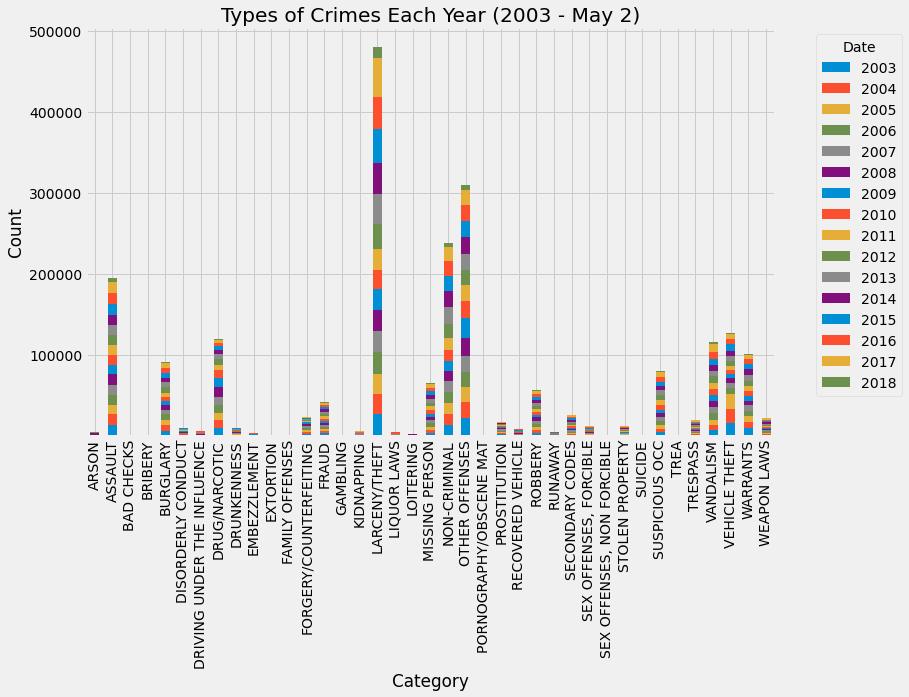

In [12]:
#Plot pivoted dataframe as a bar chart.
crime_year_by_type.plot.bar(stacked=True, figsize=(11, 7), ylabel='Count', xlabel='Category', title='Types of Crimes Each Year (2003 - May 2)')
plt.legend(title='Date', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

Above dataframes and visualizations gave us a general sense of the type of crime incidents over the years. Because there are so much information within one graph/table, it is hard to spot specific trends and to check whether relationships change when looking at different types of crime. I have picked a few crime types that seem interesting to further explore below. These include:
- assault
- bribery
- drug/narcotic
- forgery/counterfieting
- larcency/theft
- vandalism
- vehicle theft
- weapon laws

In [13]:
#Select types of crime
selective_crimes = df.loc[df['Category'].isin(
    ['ASSAULT','BRIBERY', 'DRUG/NARCOTIC', 'FORGERY/COUNTERFEITING', 
     'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'WEAPON LAWS'])]

#Create dataframe and resetting index
selective_crimes = selective_crimes.groupby([df['Date'].dt.year,'Category'])['IncidntNum'].agg(['count']).reset_index()

#Pivot table to create right formatting for visualization
selective_crimes = selective_crimes.pivot(index='Date', columns='Category', values='count')
selective_crimes

Category,ASSAULT,BRIBERY,DRUG/NARCOTIC,FORGERY/COUNTERFEITING,LARCENY/THEFT,VANDALISM,VEHICLE THEFT,WEAPON LAWS
Date,,,,,,,,
2003,13461,28,9917,2320,26393,6448,15325,1281
2004,12899,39,9897,2292,24505,6496,17884,1252
2005,11601,38,8533,2209,25319,7013,18194,1341
2006,12449,36,9069,2306,27352,7688,7291,1324
2007,12518,56,10560,2592,25770,7566,6460,1318
2008,12681,49,11648,2468,25807,7342,6053,1419
2009,12284,46,11950,2209,25585,7604,5183,1433
2010,12387,61,9205,1089,24446,7934,4346,1349
2011,12279,47,6935,820,25905,7243,4762,1329


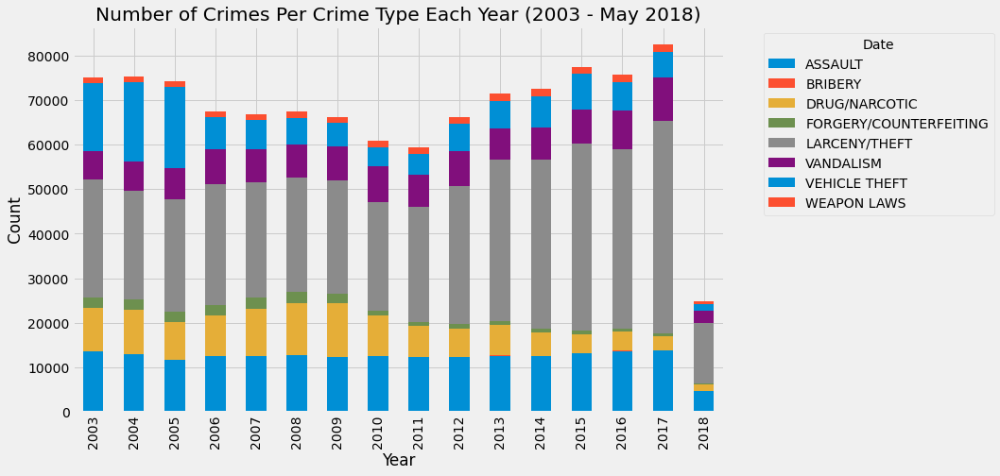

In [14]:
#Plot pivoted dataframe as a bar chart.
selective_crimes.plot.bar(stacked=True, figsize=(11, 7), ylabel='Count', 
                          xlabel='Year', title='Number of Crimes Per Crime Type Each Year (2003 - May 2018)')
plt.legend(title='Date', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

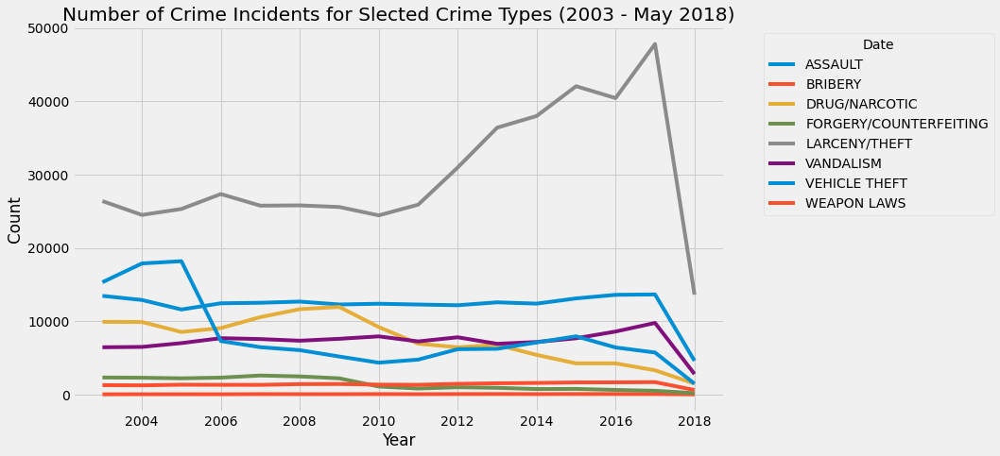

In [15]:
#Plot pivoted dataframe as a line graph.
selective_crimes.plot.line(figsize=(11, 7), ylabel='Count', xlabel='Year', 
    title='Number of Crime Incidents for Slected Crime Types (2003 - May 2018)')
plt.legend(title='Date', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

It is a little hard to observe smaller details in an aggregated graph because of the large variations and standard deviations. Below, I made separate graphs for easier visualization.

`LARCENY/THEFT`:

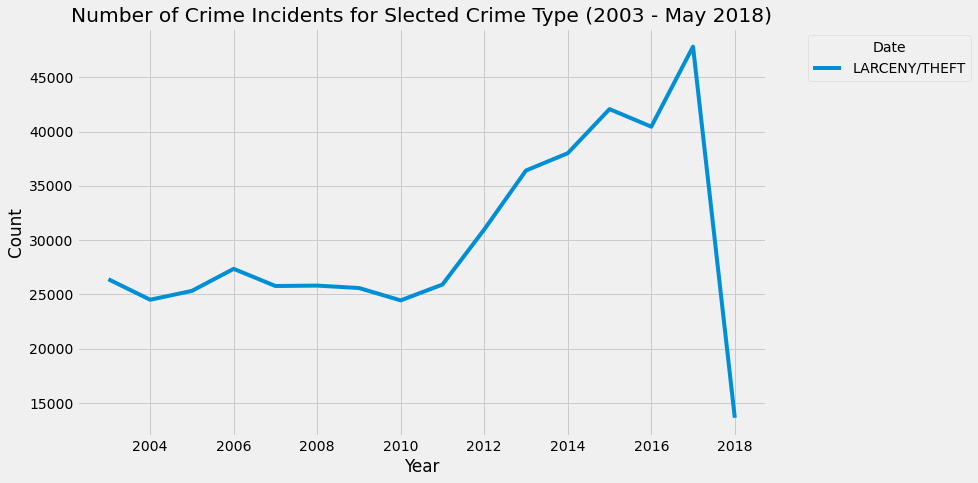

In [16]:
selective_crimes['LARCENY/THEFT'].plot.line(
    figsize=(11, 7), ylabel='Count', xlabel='Year', 
    title='Number of Crime Incidents for Slected Crime Type (2003 - May 2018)')
plt.legend(title='Date', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

`ASSAULT`, `DRUG/NARCOTIC`, `VANDALISM`, `VEHICLE THEFT`:

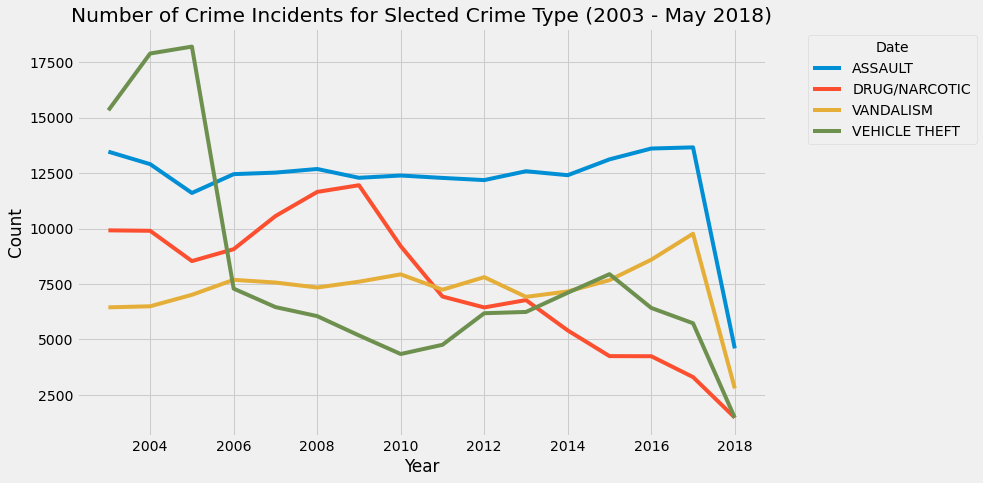

In [17]:
selective_crimes.plot.line(y=['ASSAULT', 'DRUG/NARCOTIC', 'VANDALISM', 'VEHICLE THEFT'],
    figsize=(11, 7), ylabel='Count', xlabel='Year', 
    title='Number of Crime Incidents for Slected Crime Type (2003 - May 2018)')
plt.legend(title='Date', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

`FORGERY/COUNTERFEITING`, `WEAPON LAWS`, `BRIBERY`:

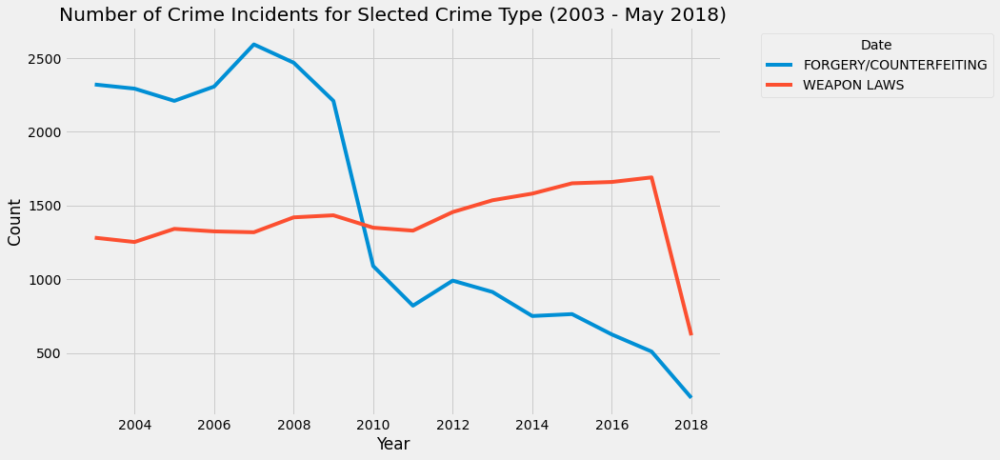

In [18]:
selective_crimes.plot.line(y=['FORGERY/COUNTERFEITING', 'WEAPON LAWS'],
    figsize=(11, 7), ylabel='Count', xlabel='Year', 
    title='Number of Crime Incidents for Slected Crime Type (2003 - May 2018)')
plt.legend(title='Date', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

`BRIBERY:`

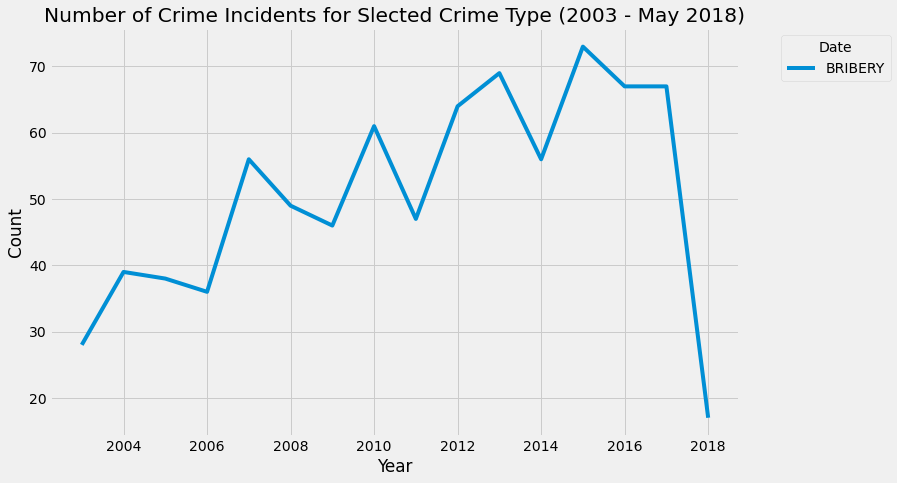

In [19]:
selective_crimes.plot.line(y='BRIBERY', figsize=(11,7), ylabel='Count', xlabel='Year', 
                           title='Number of Crime Incidents for Slected Crime Type (2003 - May 2018)')
plt.legend(title='Date', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

Taking a closer look at the different types of crimes, we see that there are crime types that increased over the years like `LARCENY/THEFT`, `WEAPON LAWS`, and `BRIBERY`, but also crime types that decreased over the years like `DRUG/NARCOTIC` and `FORGERY/COUNTERFEITING`. We see that the number of incidents for some crime types remained generally the same. An example of this would be `ASSAULTS` and `VANDALISM` up until 2015, and then we see both taking an increasing trend. Overall, the increases in crime rates for different crime types seem to take up a larger proportion of the overal crime types. This would explain why we see a slight increase in crime rates from 2003 through May 2018 in `3.1`.

### 3.3 Examining the proportion of total each type of crime constitutes in 2018:

This dataframe categorizes each type of crime, gives each crime type its corresponding value count, and shows what proportion of the total each crime type constitutes.

In [20]:
#Selecting crimes that happened in 2018.
crimes_2018 = df.loc[df['Date'].isin(['2018'])]

#Calculating the proportion each type of crimes constitutes in 2018.
crimes_2018 = crimes_2018.groupby(['Category'])['IncidntNum'].agg(['count'])
crimes_2018['Percentage'] = (crimes_2018['count'] / (crimes_2018['count'].sum())*100)
crimes_2018

,count,Percentage
Category,,
ASSAULT,49,10.816777
BURGLARY,18,3.973510
DRIVING UNDER THE INFLUENCE,2,0.441501
DRUG/NARCOTIC,7,1.545254
DRUNKENNESS,1,0.220751
EMBEZZLEMENT,1,0.220751
FRAUD,9,1.986755
LARCENY/THEFT,130,28.697572
MISSING PERSON,9,1.986755


In [21]:
#Formatting dataframe for visualization.
crimes_2018 = crimes_2018.reset_index()
crimes_2018.rename(columns={'count': 'Count'}, inplace = True)
crimes_2018

,Category,Count,Percentage
0,ASSAULT,49,10.816777
1,BURGLARY,18,3.973510
2,DRIVING UNDER THE INFLUENCE,2,0.441501
3,DRUG/NARCOTIC,7,1.545254
4,DRUNKENNESS,1,0.220751
5,EMBEZZLEMENT,1,0.220751
6,FRAUD,9,1.986755
7,LARCENY/THEFT,130,28.697572
8,MISSING PERSON,9,1.986755
9,NON-CRIMINAL,71,15.673289


Below are the visualizations for the above dataframe.

<AxesSubplot:xlabel='Category', ylabel='Count'>

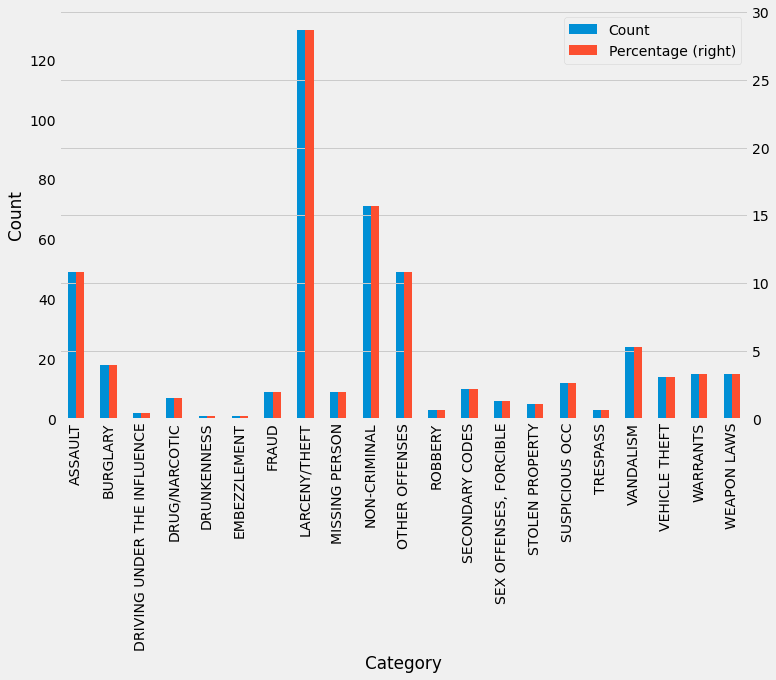

In [22]:
crimes_2018.plot.bar(x='Category', y=['Count', 'Percentage'], secondary_y='Percentage',
                     figsize=(11, 7), ylabel='Count', xlabel='Category')

For the pie chart below, I removed categories with count values that were equal to or less than 1 in order to make the lables for each share easier to see. 

<AxesSubplot:ylabel='Category'>

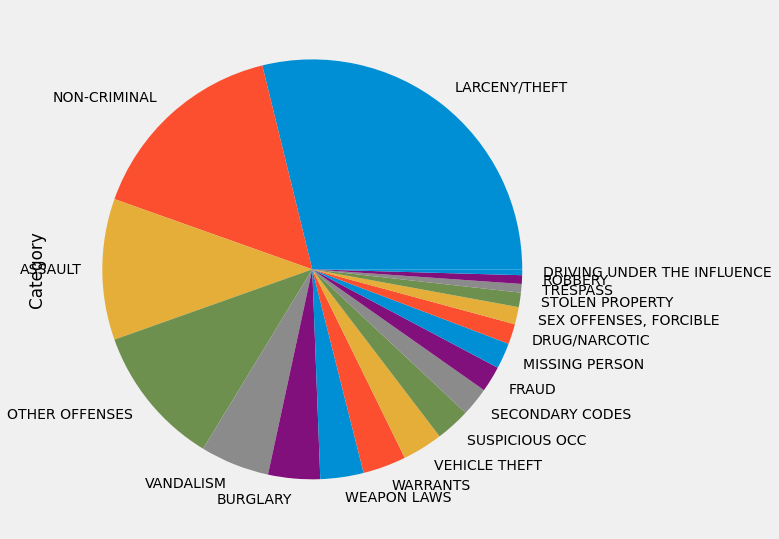

In [23]:
df['Category'].loc[df['Date'].isin(['2018'])].value_counts().head(19).plot.pie(figsize=(15,9))

### 3.4 Examining the relationship between day of week, time, and whether an incident occurs:

In [24]:
df.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,150060275,NON-CRIMINAL,LOST PROPERTY,Monday,2015-01-19,14:00,MISSION,NONE,18TH ST / VALENCIA ST,-122.421582,37.761701,"(37.7617007179518, -122.42158168137)",15006027571000
1,150098210,ROBBERY,"ROBBERY, BODILY FORCE",Sunday,2015-02-01,15:45,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,"(37.7841907151119, -122.414406029855)",15009821003074
2,150098210,ASSAULT,AGGRAVATED ASSAULT WITH BODILY FORCE,Sunday,2015-02-01,15:45,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,"(37.7841907151119, -122.414406029855)",15009821004014
3,150098210,SECONDARY CODES,DOMESTIC VIOLENCE,Sunday,2015-02-01,15:45,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,"(37.7841907151119, -122.414406029855)",15009821015200
4,150098226,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Tuesday,2015-01-27,19:00,NORTHERN,NONE,LOMBARD ST / LAGUNA ST,-122.431119,37.800469,"(37.8004687042875, -122.431118543788)",15009822628160


In [25]:
#Convert Time to datetime
df['Time'] = pd.to_datetime(df['Time'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2215024 entries, 0 to 2215023
Data columns (total 13 columns):
 #   Column      Dtype         
---  ------      -----         
 0   IncidntNum  int64         
 1   Category    object        
 2   Descript    object        
 3   DayOfWeek   object        
 4   Date        datetime64[ns]
 5   Time        datetime64[ns]
 6   PdDistrict  object        
 7   Resolution  object        
 8   Address     object        
 9   X           float64       
 10  Y           float64       
 11  Location    object        
 12  PdId        int64         
dtypes: datetime64[ns](2), float64(2), int64(2), object(7)
memory usage: 219.7+ MB


In [26]:
#Determine the number of incidents grouping by day of week and time of day.
crime_day_time = df.groupby(['DayOfWeek', df['Time'].dt.hour])['IncidntNum'].agg(['count'])
crime_day_time.head()

count
DayOfWeek Time       
Friday    0     16284
          1      8801
          2      7250
          3      4614
          4      3347

array([[<AxesSubplot:title={'center':'Friday'}>,
        <AxesSubplot:title={'center':'Monday'}>,
        <AxesSubplot:title={'center':'Saturday'}>],
       [<AxesSubplot:title={'center':'Sunday'}>,
        <AxesSubplot:title={'center':'Thursday'}>,
        <AxesSubplot:title={'center':'Tuesday'}>],
       [<AxesSubplot:title={'center':'Wednesday'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

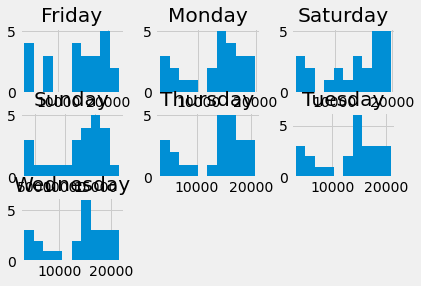

In [27]:
crime_day_time_hist = crime_day_time.reset_index().pivot(index='Time', columns='DayOfWeek', values='count').hist()
crime_day_time_hist

In [28]:
#Create order for Day of Week:
cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

#Determine the number of incidents grouping by day of week.
crime_day = df.groupby(['DayOfWeek'])['IncidntNum'].agg(['count']).reindex(cats)
crime_day.head()

,count
DayOfWeek,
Monday,306587
Tuesday,315135
Wednesday,324020
Thursday,316156
Friday,337941


<AxesSubplot:xlabel='DayOfWeek'>

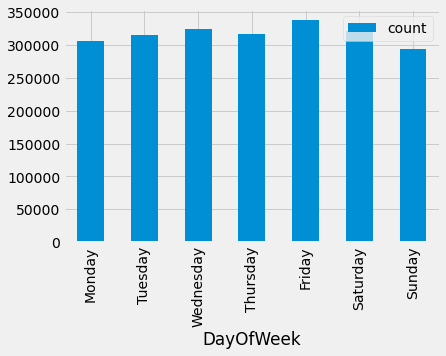

In [29]:
#Number of Crimes each Day of Week:
crime_day_bar = crime_day.reset_index().plot.bar(x='DayOfWeek')
crime_day_bar

Friday and Saturday seem to have highest crime incidents. On the other hand, Sunday and Monday have the lowest.

In [30]:
#Determine the number of incidents grouping by time (in hour) of the day.
crime_time = df.groupby(df['Time'].dt.hour)['IncidntNum'].agg(['count'])
crime_time.head()

,count
Time,
0,113096
1,65182
2,54550
3,35596
4,25285


(<AxesSubplot:xlabel='Time'>,
 array([[<AxesSubplot:title={'center':'Time'}>]], dtype=object))

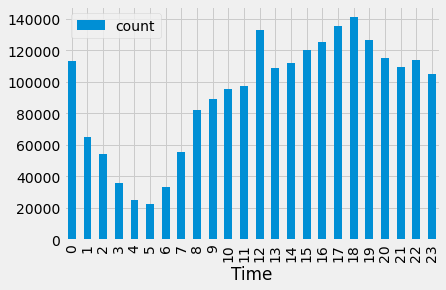

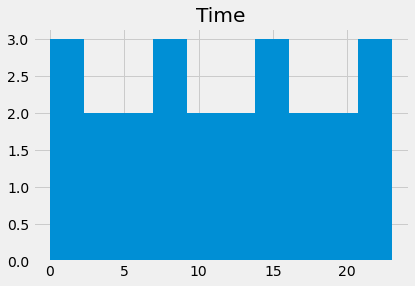

In [31]:
crime_time_graphs = crime_time.reset_index().plot.bar('Time'), crime_time.reset_index().hist('Time')
crime_time_graphs

When looking at the graphs above, we see that crimes do not typicall happen during dawn. We see greater number of crimes during midngith, noon, and rush hours.

<AxesSubplot:xlabel='Time', ylabel='count'>

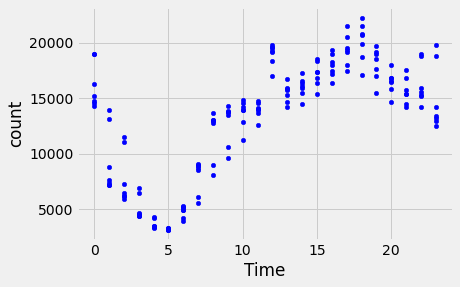

In [32]:
crime_day_time = crime_day_time.reset_index(level=0, drop=True).reset_index()
crime_day_time.plot.scatter(x='Time', y='count',c='blue')

Here, we see similar patterns to above. We see higher number of crimes at midnight, noon, and around 5 to 7pm.

### 3.5 Examining the relationship between day / time and particular type of incidents:

In [33]:
crime_day_type = df.groupby(['DayOfWeek', 'Category'])['IncidntNum'].agg(['count']).reset_index()
crime_day_type

,DayOfWeek,Category,count
0,Friday,ARSON,564
1,Friday,ASSAULT,28396
2,Friday,BAD CHECKS,143
3,Friday,BRIBERY,119
4,Friday,BURGLARY,15586
...,...,...,...
267,Wednesday,TRESPASS,3082
268,Wednesday,VANDALISM,15537
269,Wednesday,VEHICLE THEFT,17744
270,Wednesday,WARRANTS,16658


In [34]:
crime_day_type2 = crime_day_type.reset_index().pivot(index='DayOfWeek', columns='Category', values='count').reindex(cats)
crime_day_type2

Category,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,EMBEZZLEMENT,...,"SEX OFFENSES, NON FORCIBLE",STOLEN PROPERTY,SUICIDE,SUSPICIOUS OCC,TREA,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS
DayOfWeek,,,,,,,,,,,,,,,,,,,,,
Monday,574.0,26656.0,152.0,114.0,13084.0,1491.0,649.0,16906.0,1192.0,513.0,...,65.0,1711.0,205.0,11534.0,5.0,2842.0,15390.0,17283.0,14060.0,3095.0
Tuesday,591.0,26333.0,166.0,107.0,13158.0,1577.0,587.0,19114.0,1106.0,432.0,...,73.0,1809.0,183.0,11515.0,2.0,3020.0,15150.0,17223.0,15670.0,3145.0
Wednesday,526.0,26531.0,157.0,114.0,13463.0,1606.0,587.0,20675.0,1182.0,441.0,...,55.0,1829.0,174.0,12105.0,1.0,3082.0,15537.0,17744.0,16658.0,3344.0
Thursday,568.0,26021.0,157.0,117.0,13518.0,1452.0,693.0,18555.0,1153.0,432.0,...,77.0,1701.0,179.0,11730.0,2.0,2820.0,15409.0,17616.0,15358.0,3138.0
Friday,564.0,28396.0,143.0,119.0,15586.0,1227.0,876.0,16479.0,1436.0,508.0,...,54.0,1649.0,179.0,12372.0,2.0,2790.0,18486.0,20112.0,14243.0,3378.0
Saturday,549.0,30377.0,97.0,116.0,11948.0,1393.0,1155.0,14338.0,1853.0,375.0,...,58.0,1590.0,200.0,10776.0,2.0,2476.0,18861.0,18930.0,12812.0,3197.0
Sunday,559.0,30380.0,53.0,126.0,10786.0,1294.0,1125.0,13561.0,1904.0,287.0,...,49.0,1602.0,172.0,10412.0,NaN,2419.0,17226.0,17694.0,12578.0,2937.0


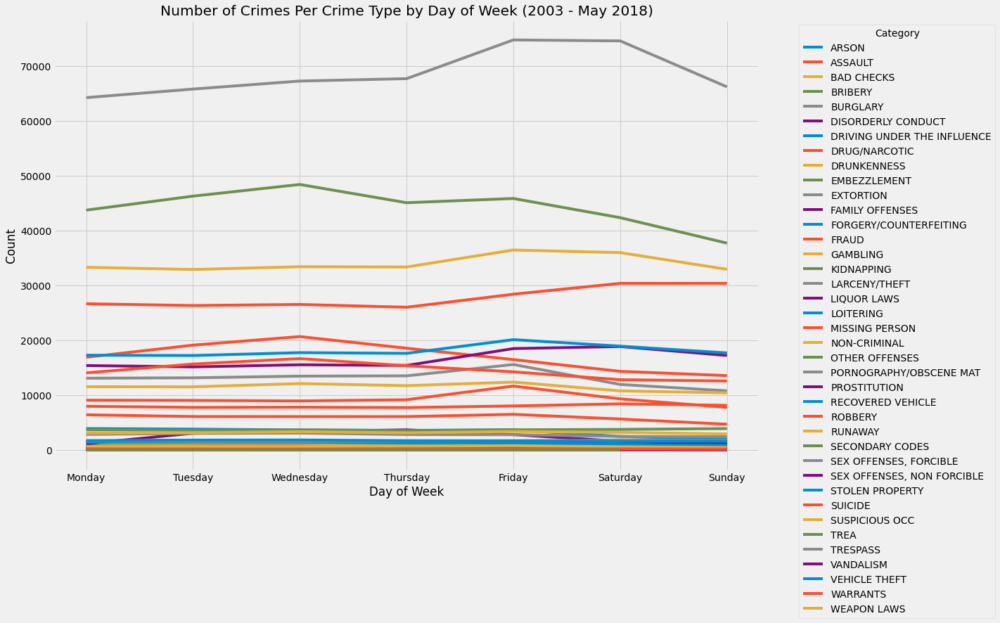

In [35]:
crime_day_type2.plot.line(figsize=(16, 11), ylabel='Count', 
                          xlabel='Day of Week', title='Number of Crimes Per Crime Type by Day of Week (2003 - May 2018)')
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

This graph gave us a comprehensive overview on the relationship between crime types and day of the week. Below, I will examine a selective few.

In [36]:
#Select types of crime
selective_crimes2 = crime_day_type.loc[crime_day_type['Category'].isin(
    ['ASSAULT','BRIBERY', 'DRUG/NARCOTIC', 'FORGERY/COUNTERFEITING', 
     'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'WEAPON LAWS'])]


#Pivot table to create right formatting for visualization
selective_crimes2 = selective_crimes2.pivot(index='DayOfWeek', columns='Category', values='count').reindex(cats)
selective_crimes2

Category,ASSAULT,BRIBERY,DRUG/NARCOTIC,FORGERY/COUNTERFEITING,LARCENY/THEFT,VANDALISM,VEHICLE THEFT,WEAPON LAWS
DayOfWeek,,,,,,,,
Monday,26656,114,16906,3908,64228,15390,17283,3095
Tuesday,26333,107,19114,3802,65788,15150,17223,3145
Wednesday,26531,114,20675,3649,67247,15537,17744,3344
Thursday,26021,117,18555,3579,67685,15409,17616,3138
Friday,28396,119,16479,3664,74746,18486,20112,3378
Saturday,30377,116,14338,2476,74565,18861,18930,3197
Sunday,30380,126,13561,1972,66189,17226,17694,2937


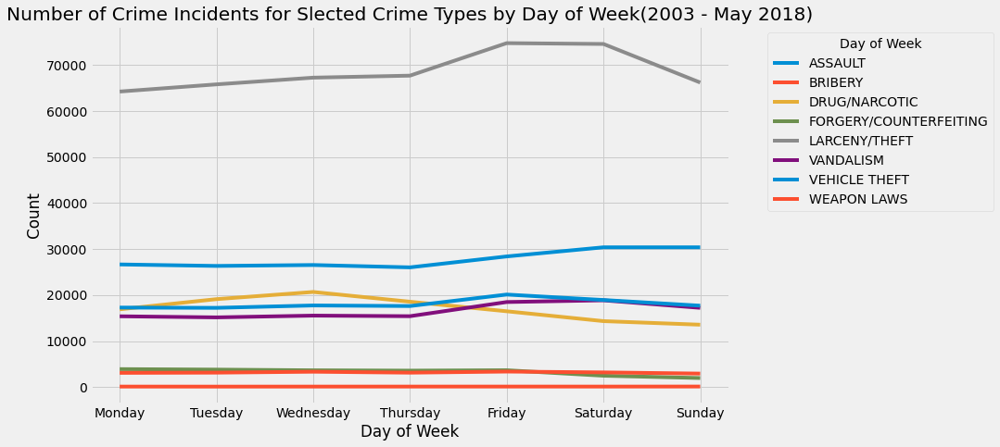

In [37]:
#Plot pivoted dataframe as a line graph.
selective_crimes2.plot.line(figsize=(11, 7), ylabel='Count', xlabel='Day of Week', 
    title='Number of Crime Incidents for Slected Crime Types by Day of Week(2003 - May 2018)')
plt.legend(title='Day of Week', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

While drug and narcotics seem to have lowest crime incidents on the weekends, for a lot of the crimes, we see a rise in crime rates on the weekends. 

In [38]:
crime_time_type = df.groupby([df['Time'].dt.hour, 'Category'])['IncidntNum'].agg(['count']).reset_index()
crime_time_type.head()

,Time,Category,count
0,0,ARSON,257
1,0,ASSAULT,10855
2,0,BAD CHECKS,162
3,0,BRIBERY,44
4,0,BURGLARY,3496


In [39]:
crime_time_type2 = crime_time_type.reset_index().pivot(index='Time', columns='Category', values='count')
crime_time_type2.head()

Category,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,EMBEZZLEMENT,...,"SEX OFFENSES, NON FORCIBLE",STOLEN PROPERTY,SUICIDE,SUSPICIOUS OCC,TREA,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS
Time,,,,,,,,,,,,,,,,,,,,,
0,257.0,10855.0,162.0,44.0,3496.0,525.0,716.0,3775.0,830.0,642.0,...,82.0,560.0,46.0,5188.0,NaN,575.0,6534.0,4769.0,4055.0,1154.0
1,244.0,9256.0,3.0,26.0,2267.0,385.0,652.0,2303.0,785.0,12.0,...,7.0,394.0,43.0,2214.0,NaN,402.0,4562.0,3255.0,2771.0,851.0
2,264.0,8389.0,2.0,27.0,2443.0,345.0,655.0,1858.0,664.0,8.0,...,2.0,330.0,31.0,2025.0,2.0,453.0,4303.0,2577.0,2310.0,759.0
3,262.0,4283.0,3.0,21.0,2517.0,216.0,290.0,1260.0,259.0,13.0,...,3.0,256.0,24.0,1404.0,NaN,370.0,2898.0,1603.0,1787.0,470.0
4,219.0,2722.0,3.0,10.0,2233.0,160.0,109.0,919.0,133.0,14.0,...,2.0,228.0,15.0,962.0,NaN,275.0,1942.0,1238.0,1365.0,317.0


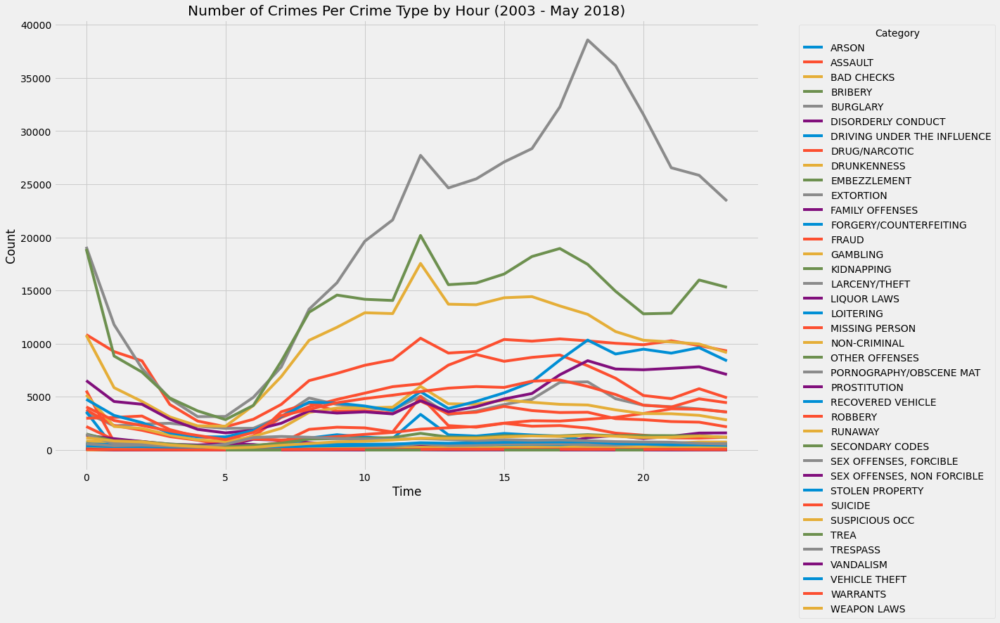

In [40]:
crime_time_type2.plot.line(figsize=(16, 11), ylabel='Count', 
                          xlabel='Time', title='Number of Crimes Per Crime Type by Hour (2003 - May 2018)')
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

The above shows us a comprehensive idea of number of crimes by hours. Below, I have plotted a selective number of crime types in order to look at it even closer.

In [41]:
#Select types of crime
selective_crimes3 = crime_time_type.loc[crime_time_type['Category'].isin(
    ['ASSAULT','BRIBERY', 'DRUG/NARCOTIC', 'FORGERY/COUNTERFEITING', 
     'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'WEAPON LAWS'])]


#Pivot table to create right formatting for visualization
selective_crimes3 = selective_crimes3.pivot(index='Time', columns='Category', values='count')
selective_crimes3.head()

Category,ASSAULT,BRIBERY,DRUG/NARCOTIC,FORGERY/COUNTERFEITING,LARCENY/THEFT,VANDALISM,VEHICLE THEFT,WEAPON LAWS
Time,,,,,,,,
0,10855,44,3775,3600,19117,6534,4769,1154
1,9256,26,2303,204,11789,4562,3255,851
2,8389,27,1858,130,7679,4303,2577,759
3,4283,21,1260,102,4825,2898,1603,470
4,2722,10,919,73,3139,1942,1238,317


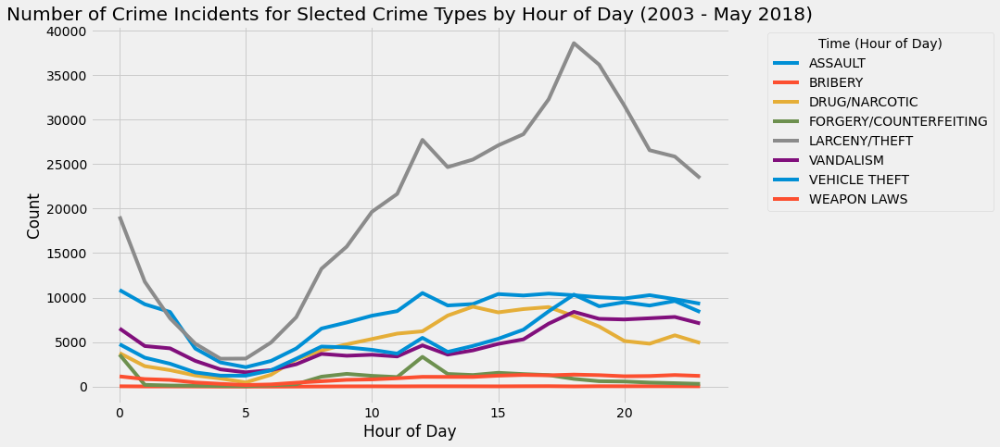

In [42]:
#Plot pivoted dataframe as a line graph.
selective_crimes3.plot.line(figsize=(11, 7), ylabel='Count', xlabel='Hour of Day', 
    title='Number of Crime Incidents for Slected Crime Types by Hour of Day (2003 - May 2018)')
plt.legend(title='Time (Hour of Day)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show();

This plot shows similar patterns to ones interpreted above. We see an increase number of crimes leading up to the weekend, and then it decreases when the start of the week (Monday) approaches.

### 3.6 Examining crime rates across neighborhoods:
- What neighborhoods experience the most crime?
- Do different neigborhoods experience different types of crimes at different rates?
- Is the distribtuion of crime spatially consistent across neighborhoods?

In [43]:
#Group incidents by district:
crime_district = df.groupby(['PdDistrict'])['IncidntNum'].agg(['count'], sort=True)

#Sort count in descending order:
crime_district = crime_district.reset_index().sort_values(['count'], ascending=False)
crime_district

,PdDistrict,count
7,SOUTHERN,399785
3,MISSION,300076
4,NORTHERN,272713
1,CENTRAL,226255
0,BAYVIEW,221000
2,INGLESIDE,194180
9,TENDERLOIN,191746
8,TARAVAL,166971
5,PARK,125479
6,RICHMOND,116818


Southern, Mission, Northern experince the most crime, more than 3 times of those at the bottom of the list like Richmond, Park, and Taraval. 

In [44]:
#Group incidents by district and category:
crime_district2 = df.groupby(['PdDistrict','Category'])['IncidntNum'].agg(['count'], sort=True)
crime_district2

count
PdDistrict Category            
BAYVIEW    ARSON           1000
           ASSAULT        24812
           BAD CHECKS        73
           BRIBERY          159
           BURGLARY        9664
...                         ...
TENDERLOIN TRESPASS        2698
           VANDALISM       4214
           VEHICLE THEFT   2379
           WARRANTS       16549
           WEAPON LAWS     2061

[387 rows x 1 columns]

In [45]:
#Sort count in descending order:
crime_district2 = crime_district2.reset_index().sort_values(['count'], ascending=False).head(15)

#Create corresponding percentages
crime_district3 = crime_district2.merge(crime_district, how='outer', left_on='PdDistrict', right_on='PdDistrict')

crime_district3['Percentage'] = (crime_district3['count_x'] / (crime_district3['count_y'].sum())*100)
crime_district3

,PdDistrict,Category,count_x,count_y,Percentage
0,SOUTHERN,LARCENY/THEFT,113342.0,399785,2.530526
1,SOUTHERN,OTHER OFFENSES,51403.0,399785,1.147647
2,SOUTHERN,NON-CRIMINAL,49821.0,399785,1.112327
3,SOUTHERN,ASSAULT,31314.0,399785,0.699131
4,NORTHERN,LARCENY/THEFT,80988.0,272713,1.808176
5,NORTHERN,OTHER OFFENSES,30973.0,272713,0.691518
6,CENTRAL,LARCENY/THEFT,71948.0,226255,1.606345
7,MISSION,LARCENY/THEFT,48960.0,300076,1.093104
8,MISSION,OTHER OFFENSES,47363.0,300076,1.057448
9,MISSION,NON-CRIMINAL,31911.0,300076,0.712460


Crime rates by type in a neighborhood differs. However, we see that neighborhoods who tend to have higher crime rates in general, also have higher crime rates by type overall.

### 3.7 Discuss two other interesting findings:

One interesting, but expected finding is assualt. We see that for assaults occur more often on Friday and Saturdays. It also happens more often at night. It is interesting to see from the data that it aligns with what we would hypothesize. Oftentimes assult occur at night, and people tend to be out more often on Fridays and Saturdays, so it makes sense that we see higher number of assaults happening in those times.

Looking at the table in 3.6, we see that Tenderloin has a pretty high drug/narcotic crime rate. This also aligns with my past impression of Tenderloin. Tenderloin is a neighborhood near the downtown area, with a reputation where a lot of unhoused and the intoxicated group together.

# 4 Geographic Data

## 4.1 Plot individual incidents in 2018 as points on a map of San Francisco:

In [46]:
#Selecting all data for incidents in 2018
df_2018 = df.loc[df['Date'].isin(['2018'])]
df_2018

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
1839433,180000122,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Monday,2018-01-01,2021-04-30 00:32:00,NORTHERN,"ARREST, BOOKED",WEBSTER ST / OAK ST,-122.429179,37.774182,"(37.774182253014295, -122.42917887616841)",18000012265050
1839438,180000213,SUSPICIOUS OCC,INVESTIGATIVE DETENTION,Monday,2018-01-01,2021-04-30 01:52:00,SOUTHERN,NONE,MARKET ST / STOCKTON ST,-122.405832,37.785745,"(37.785744654560894, -122.40583247448238)",18000021364085
1839440,180000348,ASSAULT,BATTERY,Monday,2018-01-01,2021-04-30 02:28:00,SOUTHERN,NONE,HARRISON ST / 3RD ST,-122.397389,37.782554,"(37.78255434524264, -122.39738878482612)",18000034804134
1839443,180000348,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,2018-01-01,2021-04-30 02:28:00,SOUTHERN,NONE,HARRISON ST / 3RD ST,-122.397389,37.782554,"(37.78255434524264, -122.39738878482612)",18000034828160
1839444,180000514,ASSAULT,"BATTERY, FORMER SPOUSE OR DATING RELATIONSHIP",Monday,2018-01-01,2021-04-30 04:11:00,RICHMOND,"ARREST, BOOKED",100 Block of WOOD ST,-122.448848,37.781526,"(37.78152563208178, -122.44884845909797)",18000051404138
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179523,180002491,MISSING PERSON,MISSING ADULT,Monday,2018-01-01,2021-04-30 14:30:00,RICHMOND,NONE,1400 Block of BRODERICK ST,-122.441371,37.783871,"(37.783871081120125, -122.44137135214766)",18000249174000
2179524,180002491,MISSING PERSON,FOUND PERSON,Monday,2018-01-01,2021-04-30 14:30:00,RICHMOND,NONE,1400 Block of BRODERICK ST,-122.441371,37.783871,"(37.783871081120125, -122.44137135214766)",18000249175000
2179714,180005655,NON-CRIMINAL,LOST PROPERTY,Monday,2018-01-01,2021-04-30 12:00:00,CENTRAL,NONE,STOCKTON ST / WASHINGTON ST,-122.408083,37.794941,"(37.79494058802835, -122.4080831553688)",18000565571000
2179884,180007479,VEHICLE THEFT,STOLEN AUTOMOBILE,Monday,2018-01-01,2021-04-30 12:00:00,SOUTHERN,NONE,15TH ST / VERMONT ST,-122.404753,37.767256,"(37.76725619810644, -122.40475255896236)",18000747907021


In [47]:
#Use geopandas to transform DataFrame to GeoDataFrame
gdf_2018 = gpd.GeoDataFrame(
    df_2018, geometry=gpd.points_from_xy(df_2018.X, df_2018.Y))
gdf_2018.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId,geometry
1839433,180000122,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Monday,2018-01-01,2021-04-30 00:32:00,NORTHERN,"ARREST, BOOKED",WEBSTER ST / OAK ST,-122.429179,37.774182,"(37.774182253014295, -122.42917887616841)",18000012265050,POINT (-122.42918 37.77418)
1839438,180000213,SUSPICIOUS OCC,INVESTIGATIVE DETENTION,Monday,2018-01-01,2021-04-30 01:52:00,SOUTHERN,NONE,MARKET ST / STOCKTON ST,-122.405832,37.785745,"(37.785744654560894, -122.40583247448238)",18000021364085,POINT (-122.40583 37.78574)
1839440,180000348,ASSAULT,BATTERY,Monday,2018-01-01,2021-04-30 02:28:00,SOUTHERN,NONE,HARRISON ST / 3RD ST,-122.397389,37.782554,"(37.78255434524264, -122.39738878482612)",18000034804134,POINT (-122.39739 37.78255)
1839443,180000348,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,2018-01-01,2021-04-30 02:28:00,SOUTHERN,NONE,HARRISON ST / 3RD ST,-122.397389,37.782554,"(37.78255434524264, -122.39738878482612)",18000034828160,POINT (-122.39739 37.78255)
1839444,180000514,ASSAULT,"BATTERY, FORMER SPOUSE OR DATING RELATIONSHIP",Monday,2018-01-01,2021-04-30 04:11:00,RICHMOND,"ARREST, BOOKED",100 Block of WOOD ST,-122.448848,37.781526,"(37.78152563208178, -122.44884845909797)",18000051404138,POINT (-122.44885 37.78153)


In [48]:
import folium
from folium.features import CustomIcon
from folium.plugins import MarkerCluster

sf_coords = (37.76, -122.45)
sf_map = folium.Map(sf_coords, zoom_start = 12)

#folium.LayerControl().add_to(sf_map)
marker_cluster = MarkerCluster().add_to(sf_map)


In [49]:
coords = list(zip(gdf_2018['Y'], gdf_2018['X']))

for i in range(0, len(gdf_2018)):
    folium.Circle(coords[i], popup=gdf_2018.iloc[i]['Category']).add_to(marker_cluster)

sf_map

Incidents seem to cluster closer toegether. By looking at the above crime clusters, we see that there are higher number of incidents in the downtown area, and fewer incidents farther out.

In [50]:
#Creating corresponding colors for each category.

#Find the total number of colors we need to categorize each crime type:
len(gdf_2018['Category'].value_counts())

#Categories of Crimes:
gdf_2018['Category'].value_counts()

LARCENY/THEFT                  130
NON-CRIMINAL                    71
ASSAULT                         49
OTHER OFFENSES                  49
VANDALISM                       24
BURGLARY                        18
WEAPON LAWS                     15
WARRANTS                        15
VEHICLE THEFT                   14
SUSPICIOUS OCC                  12
SECONDARY CODES                 10
FRAUD                            9
MISSING PERSON                   9
DRUG/NARCOTIC                    7
SEX OFFENSES, FORCIBLE           6
STOLEN PROPERTY                  5
TRESPASS                         3
ROBBERY                          3
DRIVING UNDER THE INFLUENCE      2
EMBEZZLEMENT                     1
DRUNKENNESS                      1
Name: Category, dtype: int64

In [51]:
#Create a function to assign a unique color to each crime category:
def categorycolors(category):
    if category['Category'] == 'LARCENCY/THEFT':
        return 'red'
    elif category['Category'] == 'NON-CRIMINAL':
        return 'blue'
    elif category['Category'] == 'ASSAULT':
        return 'green'
    elif category['Category'] == 'OTHER OFFENSES':
        return 'purple'
    elif category['Category'] == 'VANDALISM':
        return 'orange'
    elif category['Category'] == 'BURGLARY':
        return 'gray'
    elif category['Category'] == 'WARRANTS':
        return 'black'
    elif category['Category'] == 'WEAPON LAWS':
        return 'darkred'
    elif category['Category'] == 'VEHICLE THEFT':
        return 'lightred'
    elif category['Category'] == 'SUSPICIOUS OCC':
        return 'beige'
    elif category['Category'] == 'SECONDARY CODES':
        return 'darkblue'
    elif category['Category'] == 'MISSING PERSON':
        return 'darkgreen'
    elif category['Category'] == 'FRAUD':
        return 'cadetblue'
    elif category['Category'] == 'DRUG/NARCOTIC':
        return 'darkpurple'
    elif category['Category'] == 'SEX OFFENSES, FORCIBLE':
        return 'white'
    elif category['Category'] == 'STOLEN PROPERTY':
        return 'pink'
    elif category['Category'] == 'ROBBERY':
        return 'lightblue'
    elif category['Category'] == 'TRESPASS':
        return 'lightgreen'
    elif category['Category'] == 'DRIVING UNDER THE INFLUENCE':
        return 'lightgray'
    elif category['Category'] == 'EMBEZZLEMENT':
        return '728000'
    else:
        return 'FFF200'
 
#Create column with new colors for each category.
gdf_2018['Color'] = gdf_2018.apply(categorycolors, axis=1)
gdf_2018.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId,geometry,Color
1839433,180000122,DRIVING UNDER THE INFLUENCE,DRIVING WHILE UNDER THE INFLUENCE OF ALCOHOL,Monday,2018-01-01,2021-04-30 00:32:00,NORTHERN,"ARREST, BOOKED",WEBSTER ST / OAK ST,-122.429179,37.774182,"(37.774182253014295, -122.42917887616841)",18000012265050,POINT (-122.42918 37.77418),lightgray
1839438,180000213,SUSPICIOUS OCC,INVESTIGATIVE DETENTION,Monday,2018-01-01,2021-04-30 01:52:00,SOUTHERN,NONE,MARKET ST / STOCKTON ST,-122.405832,37.785745,"(37.785744654560894, -122.40583247448238)",18000021364085,POINT (-122.40583 37.78574),beige
1839440,180000348,ASSAULT,BATTERY,Monday,2018-01-01,2021-04-30 02:28:00,SOUTHERN,NONE,HARRISON ST / 3RD ST,-122.397389,37.782554,"(37.78255434524264, -122.39738878482612)",18000034804134,POINT (-122.39739 37.78255),green
1839443,180000348,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,2018-01-01,2021-04-30 02:28:00,SOUTHERN,NONE,HARRISON ST / 3RD ST,-122.397389,37.782554,"(37.78255434524264, -122.39738878482612)",18000034828160,POINT (-122.39739 37.78255),orange
1839444,180000514,ASSAULT,"BATTERY, FORMER SPOUSE OR DATING RELATIONSHIP",Monday,2018-01-01,2021-04-30 04:11:00,RICHMOND,"ARREST, BOOKED",100 Block of WOOD ST,-122.448848,37.781526,"(37.78152563208178, -122.44884845909797)",18000051404138,POINT (-122.44885 37.78153),green


In [52]:
sf_map2 = folium.Map(sf_coords, zoom_start = 12)

marker_cluster = MarkerCluster().add_to(sf_map2)


for i in range(0, len(gdf_2018)):
    folium.CircleMarker(coords[i], popup=gdf_2018.iloc[i]['Category']+' '+'('+gdf_2018.iloc[i]['PdDistrict']+')', color=gdf_2018.iloc[i]['Color'], fill=True).add_to(sf_map2)

sf_map2

All crime types seem to be spread across the entire city, but once again, we see, on average, larger concentrations near downtown and in Tinderloin/Mission area. If we look closely, we do see some crime types that are disporportionately more common in certain neighborhods. For example, we see that warrants are typically located closer to residential areas. Conversely, vandalism markers are typically located on larger streets and commericial areas. Larcency/theft are pretty common. While they happen across all parts of the city, we tend see them in Bayview, Northern, Park and Central `PdDistricts`, which are closer to the city center (business areas) and the Tenderloin area.

When we look at neighborhoods that tend have higher median income or areas with mostly single-family homes, we see fewer crime incidents. An example of this would be Presidio Heights, Noe Valley, Twin Peaks, Pacific Heights, and Inner Sunset, which are mainly made up of single family households and are areas with higher median home values. Conversely, when we look at Tenderloin, Mission, and Bayview areas, we see higher crime rates.

We see that concentrations of crime incidents typically happen in either low-income, racially diverse neighborhoods, or downtown areas. This is partly due to three main reasons:
1. Higher income areas tend to be farther away from the city center. This makes it harder to commute to. For instance, Pacific Heights and Twin Peaks are both very hilly and are not walking distance from the highly densely populated areas of San Francisco or other less affluent neighborhoods. 
2. Residents in high income neighborhoods tend to have better security and facility. They can afford and often invest in security alarms and systems. Furthermore, affluent neighborhoods tend to have neighborhoods watch programs that work with the local enforcements.
3. Affluent neighborhoods are typically close knitted. Unlike the inner city, individuals from high-income neighborhoods or neighborhoods with single family homes are usually more socially connected with one another. If something happens, they tend to look out for each other. 
4. Inner cities and highly densely populated areas (downtown) have higher crime rates because we see greater diversity in demographic structures.

## 4.2 Merge the incidents data with GeoJSON to see boundaries of neighborhoods

In [53]:
#Load GeoJSON file:
import geopandas
geo_json = geopandas.read_file('SF Find Neighborhoods.geojson')
geo_json


,link,name,geometry
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937..."
1,None,Lake Street,"MULTIPOLYGON (((-122.48715 37.78379, -122.4872..."
2,http://www.nps.gov/prsf/index.htm,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771..."
3,None,Presidio Terrace,"MULTIPOLYGON (((-122.47241 37.78735, -122.4710..."
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668..."
...,...,...,...
112,"http://en.wikipedia.org/wiki/Corona_Heights,_S...",Corona Heights,"MULTIPOLYGON (((-122.43519 37.76267, -122.4353..."
113,http://en.wikipedia.org/wiki/Haight-Ashbury,Ashbury Heights,"MULTIPOLYGON (((-122.45196 37.76148, -122.4521..."
114,"http://en.wikipedia.org/wiki/Eureka_Valley,_Sa...",Eureka Valley,"MULTIPOLYGON (((-122.43734 37.76235, -122.4370..."
115,"http://en.wikipedia.org/wiki/St._Francis_Wood,...",St. Francis Wood,"MULTIPOLYGON (((-122.47157 37.73471, -122.4683..."


In [54]:
#Convert to GeoDataFrame and set CRS:
gdf_json = geopandas.GeoDataFrame(geo_json, geometry='geometry')
gdf_json = gdf_json.to_crs('EPSG:4326')

In [55]:
#Convert df to GeoDataFrame:
gdf = gpd.GeoDataFrame(
    df, geometry=geopandas.points_from_xy(df.X, df.Y))

#Set CRS
gdf = gdf.set_crs(epsg=4326, inplace=True)


In [56]:
#Join gdf and gdf_json
data = geopandas.sjoin(gdf_json, gdf, how='left', op='intersects')

In [57]:
data

,link,name,geometry,index_right,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1873669,160478044,NON-CRIMINAL,FOUND PROPERTY,Sunday,2016-06-12,2021-04-30 12:00:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.484730,37.787693,"(37.787692679901674, -122.48472974926183)",16047804472000
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1866697,150999533,OTHER OFFENSES,MISCELLANEOUS INVESTIGATION,Monday,2015-11-16,2021-04-30 21:38:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.484730,37.787693,"(37.7876926799017, -122.484729749262)",15099953368020
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1818067,156065716,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Tuesday,2015-03-17,2021-04-30 00:01:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.484730,37.787693,"(37.7876926799017, -122.484729749262)",15606571606244
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1866696,150999533,OTHER OFFENSES,VIOLATION OF MUNICIPAL CODE,Monday,2015-11-16,2021-04-30 21:38:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.484730,37.787693,"(37.7876926799017, -122.484729749262)",15099953330200
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1239141,110000675,WEAPON LAWS,DISCHARGE FIREARM WITHIN CITY LIMITS,Saturday,2011-01-01,2021-04-30 02:30:00,RICHMOND,EXCEPTIONAL CLEARANCE,100 Block of ELCAMINODELMAR ST,-122.484730,37.787693,"(37.7876926799017, -122.484729749262)",11000067512027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,http://en.wikipedia.org/wiki/Neighborhoods_in_...,Sherwood Forest,"MULTIPOLYGON (((-122.45890 37.74054, -122.4587...",1581961,30287472,ASSAULT,INFLICT INJURY ON COHABITEE,Saturday,2003-03-08,2021-04-30 08:00:00,INGLESIDE,NONE,500 Block of LOS PALMOS DR,-122.454263,37.734174,"(37.7341744099267, -122.454263337194)",3028747215040
116,http://en.wikipedia.org/wiki/Neighborhoods_in_...,Sherwood Forest,"MULTIPOLYGON (((-122.45890 37.74054, -122.4587...",415885,41198612,VEHICLE THEFT,STOLEN TRUCK,Tuesday,2004-10-19,2021-04-30 09:00:00,INGLESIDE,NONE,500 Block of MELROSE AV,-122.453248,37.733448,"(37.7334477031766, -122.453248257237)",4119861207025
116,http://en.wikipedia.org/wiki/Neighborhoods_in_...,Sherwood Forest,"MULTIPOLYGON (((-122.45890 37.74054, -122.4587...",466317,41198612,VEHICLE THEFT,"VEHICLE, RECOVERED, OTHER VEHICLE",Tuesday,2004-10-19,2021-04-30 09:00:00,INGLESIDE,NONE,500 Block of MELROSE AV,-122.453248,37.733448,"(37.7334477031766, -122.453248257237)",4119861207046
116,http://en.wikipedia.org/wiki/Neighborhoods_in_...,Sherwood Forest,"MULTIPOLYGON (((-122.45890 37.74054, -122.4587...",133034,146216872,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM",Monday,2014-10-13,2021-04-30 19:00:00,INGLESIDE,NONE,500 Block of MELROSE AV,-122.453248,37.733448,"(37.7334477031766, -122.453248257237)",14621687228150


In [58]:
#Add GeoJSON file as overlay to sf_map:
folium.GeoJson(geo_json).add_to(sf_map)

sf_map

# 5 Mapping Incidents

## 5.1 Construct a choropleth map.
#### Coloring in each neighborhood by how many incidents it had in 2017. 

In [59]:
#Create dataframe for number of crime incidents by neighborhood:
neighbor = data.pivot_table(index='name', 
                     columns=data['Date'].dt.year, 
                     values='IncidntNum',
                     fill_value=0, 
                     aggfunc='count').unstack().to_frame().rename(columns={0:'count'}).reset_index()

neighbor.head()

,Date,name,count
0,2003,Alamo Square,431
1,2003,Anza Vista,654
2,2003,Apparel City,394
3,2003,Aquatic Park / Ft. Mason,309
4,2003,Ashbury Heights,174


In [60]:
#Subsetting data for 2017:
neighbor_2017 = neighbor.loc[neighbor['Date'].isin(['2017'])].reset_index()
neighbor_2017

,index,Date,name,count
0,1638,2017,Alamo Square,914
1,1639,2017,Anza Vista,613
2,1640,2017,Apparel City,497
3,1641,2017,Aquatic Park / Ft. Mason,726
4,1642,2017,Ashbury Heights,206
...,...,...,...,...
112,1750,2017,West Portal,377
113,1751,2017,Western Addition,2835
114,1752,2017,Westwood Highlands,31
115,1753,2017,Westwood Park,259


In [61]:
#Create base map:
sf_map3 = folium.Map(sf_coords, zoom_start = 12)

folium.GeoJson(geo_json,
              style_function=lambda feature: {
                  'fillColor': 'white',
                  'color': 'black',
                  'weight': 1,
                  'dashArray': '5, 5'
              }).add_to(sf_map3)

sf_map3

In [62]:
#Convert count into a dictionary:
count_dict = neighbor_2017.set_index('name')['count']
count_dict

name
Alamo Square                 914
Anza Vista                   613
Apparel City                 497
Aquatic Park / Ft. Mason     726
Ashbury Heights              206
                            ... 
West Portal                  377
Western Addition            2835
Westwood Highlands            31
Westwood Park                259
Yerba Buena Island           228
Name: count, Length: 117, dtype: int64

In [63]:
#Plot count by neighborhood:
bins = list(neighbor_2017['count'].quantile([0, 0.5, 0.75, 0.95, 0.98, 0.99, 1]))

folium.Choropleth(
    geo_data=geo_json, 
    data=neighbor_2017,
    columns=['name', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of Crime Incidents (Percentile: 0, 0.5, 0.75, 0.95, 0.98, 0.99, 1)',
    bins=bins,
    reset=True,
).add_to(sf_map3)


folium.LayerControl().add_to(sf_map3)

sf_map3

#### Construct several maps that explore differences by day of week, time of year, time of day, etc.

In [64]:
data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2221250 entries, 0 to 116
Data columns (total 17 columns):
 #   Column       Dtype         
---  ------       -----         
 0   link         object        
 1   name         object        
 2   geometry     geometry      
 3   index_right  int64         
 4   IncidntNum   int64         
 5   Category     object        
 6   Descript     object        
 7   DayOfWeek    object        
 8   Date         datetime64[ns]
 9   Time         datetime64[ns]
 10  PdDistrict   object        
 11  Resolution   object        
 12  Address      object        
 13  X            float64       
 14  Y            float64       
 15  Location     object        
 16  PdId         int64         
dtypes: datetime64[ns](2), float64(2), geometry(1), int64(3), object(9)
memory usage: 305.0+ MB


In [65]:
data2 = data.pivot_table(index='name', 
                     columns=data['Time'].dt.hour, 
                     values='IncidntNum',
                     fill_value=0, 
                     aggfunc='count').unstack().to_frame().rename(columns={0:'count'})
data2

count
Time name                           
0    Alamo Square                333
     Anza Vista                  260
     Apparel City                332
     Aquatic Park / Ft. Mason    158
     Ashbury Heights             140
...                              ...
23   West Portal                 254
     Western Addition           1749
     Westwood Highlands           27
     Westwood Park               115
     Yerba Buena Island          154

[2808 rows x 1 columns]

In [66]:
data2 = data2.reset_index()
data2.head()

,Time,name,count
0,0,Alamo Square,333
1,0,Anza Vista,260
2,0,Apparel City,332
3,0,Aquatic Park / Ft. Mason,158
4,0,Ashbury Heights,140


In [67]:
#Splitting crime by hours:
midnight = data2.loc[data2['Time'].isin(['0'])]
dawn = data2.loc[data2['Time'].isin(['6'])]
morning = data2.loc[data2['Time'].isin(['9'])]
noon = data2.loc[data2['Time'].isin(['12'])]
afternoon = data2.loc[data2['Time'].isin(['15'])]
sunset = data2.loc[data2['Time'].isin(['18'])]
evening = data2.loc[data2['Time'].isin(['22'])]
dawn.head()

,Time,name,count
702,6,Alamo Square,76
703,6,Anza Vista,81
704,6,Apparel City,84
705,6,Aquatic Park / Ft. Mason,44
706,6,Ashbury Heights,53


In [68]:
sf_map4 = folium.Map(sf_coords, zoom_start = 12)

bins = list(midnight['count'].quantile([0, 0.25, 0.5, 0.75, 0.95, 0.98, 1]))

folium.Choropleth(
    geo_data=geo_json, 
    data=midnight,
    columns=['name', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of Crime Incidents (Percentile: 0, 0.25, 0.5, 0.75, 0.95, 0.98, 1)',
    bins=bins,
).add_to(sf_map4)


folium.LayerControl().add_to(sf_map4)

sf_map4

In [69]:
sf_map5 = folium.Map(sf_coords, zoom_start = 12)

bins = list(dawn['count'])

folium.Choropleth(
    geo_data=geo_json, 
    data=morning,
    columns=['name', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of Crime Incidents)',
    thresholdscale = bins,
).add_to(sf_map5)


folium.LayerControl().add_to(sf_map5)

sf_map5

In [70]:
sf_map6 = folium.Map(sf_coords, zoom_start = 12)

bins = list(morning['count'].quantile([0, 0.75, 0.90, 0.95, 0.98, 1]))

folium.Choropleth(
    geo_data=geo_json, 
    data=morning,
    columns=['name', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of Crime Incidents (Percentile: 0, 0.75, 0.90, 0.95, 0.98, 1)',
    bins=bins,
).add_to(sf_map6)


folium.LayerControl().add_to(sf_map6)

sf_map6

In [71]:
sf_map7 = folium.Map(sf_coords, zoom_start = 12)

bins = list(noon['count'])

folium.Choropleth(
    geo_data=geo_json, 
    data=morning,
    columns=['name', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of Crime Incidents',
    thresholdscale=bins,
).add_to(sf_map7)


folium.LayerControl().add_to(sf_map7)

sf_map7

In [72]:
sf_map8 = folium.Map(sf_coords, zoom_start = 12)

bins = list(afternoon['count'])

folium.Choropleth(
    geo_data=geo_json, 
    data=morning,
    columns=['name', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of Crime Incidents',
    thresholdscale=bins,
).add_to(sf_map8)


folium.LayerControl().add_to(sf_map8)

sf_map8

In [73]:
sf_map9 = folium.Map(sf_coords, zoom_start = 12)

bins = list(sunset['count'])

folium.Choropleth(
    geo_data=geo_json, 
    data=morning,
    columns=['name', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of Crime Incidents',
    thresholdscale=bins,
).add_to(sf_map9)


folium.LayerControl().add_to(sf_map9)

sf_map9

In [74]:
sf_map10 = folium.Map(sf_coords, zoom_start = 12)

bins = list(evening['count'].quantile([0, 0.4, 0.8, 0.9, 0.95, 0.98, 1]))

folium.Choropleth(
    geo_data=geo_json, 
    data=morning,
    columns=['name', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of Crime Incidents (Percentile: 0, 0.4, 0.8, 0.9, 0.95, 0.98, 1)',
    bins=bins,
).add_to(sf_map10)


folium.LayerControl().add_to(sf_map10)

sf_map10

##### Choropleth (Month v. Incidents):

In [75]:
data.head()

,link,name,geometry,index_right,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1873669,160478044,NON-CRIMINAL,FOUND PROPERTY,Sunday,2016-06-12,2021-04-30 12:00:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.48473,37.787693,"(37.787692679901674, -122.48472974926183)",16047804472000
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1866697,150999533,OTHER OFFENSES,MISCELLANEOUS INVESTIGATION,Monday,2015-11-16,2021-04-30 21:38:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.48473,37.787693,"(37.7876926799017, -122.484729749262)",15099953368020
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1818067,156065716,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Tuesday,2015-03-17,2021-04-30 00:01:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.48473,37.787693,"(37.7876926799017, -122.484729749262)",15606571606244
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1866696,150999533,OTHER OFFENSES,VIOLATION OF MUNICIPAL CODE,Monday,2015-11-16,2021-04-30 21:38:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.48473,37.787693,"(37.7876926799017, -122.484729749262)",15099953330200
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1239141,110000675,WEAPON LAWS,DISCHARGE FIREARM WITHIN CITY LIMITS,Saturday,2011-01-01,2021-04-30 02:30:00,RICHMOND,EXCEPTIONAL CLEARANCE,100 Block of ELCAMINODELMAR ST,-122.48473,37.787693,"(37.7876926799017, -122.484729749262)",11000067512027


In [76]:
#Setting up dataframe for crime inident by month:
data3 = data.pivot_table(index='name', 
                     columns=data['Date'].dt.month, 
                     values='IncidntNum',
                     fill_value=0, 
                     aggfunc='count').unstack().to_frame().rename(columns={0:'count'})
data3

count
Date name                           
1    Alamo Square                671
     Anza Vista                  649
     Apparel City                512
     Aquatic Park / Ft. Mason    498
     Ashbury Heights             228
...                              ...
12   West Portal                 431
     Western Addition           3561
     Westwood Highlands           32
     Westwood Park               289
     Yerba Buena Island          267

[1404 rows x 1 columns]

In [77]:
data3 = data3.reset_index()
data3.head()

,Date,name,count
0,1,Alamo Square,671
1,1,Anza Vista,649
2,1,Apparel City,512
3,1,Aquatic Park / Ft. Mason,498
4,1,Ashbury Heights,228


In [78]:
#Splitting crime by month bins:
winter = data3.loc[data3['Date'].isin([11, 12, 1, 2])]
spring = data3.loc[data3['Date'].isin(range(3,6))]
summer = data3.loc[data3['Date'].isin(range(6,9))]
fall = data3.loc[data3['Date'].isin(range(9,11))]

In [79]:
sf_map11 = folium.Map(sf_coords, zoom_start = 12)

#bins = list(winter['count']).quantile([0, 0.4, 0.8, 0.9, 0.95, 0.98, 1])

folium.Choropleth(
    geo_data=geo_json, 
    data=winter,
    columns=['name', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of Crime Incidents (Winter)',
    thresholdscale=[0, 2, 4, 8, 16, 32],
).add_to(sf_map11)


folium.LayerControl().add_to(sf_map11)

sf_map11

In [80]:
sf_map12 = folium.Map(sf_coords, zoom_start = 12)


folium.Choropleth(
    geo_data=geo_json, 
    data=summer,
    columns=['name', 'count'],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of Crime Incidents (Summer)',
).add_to(sf_map12)


folium.LayerControl().add_to(sf_map12)

sf_map12

## 5.2 Spotting patterns and concentration of crimes

Because the crime numbers are so extreme across different neighborhoods, I have created my own bins that would allow for the most gradient differences. It is also interesting to see the differences in number count between different percentiles. 

That being said, there are neighborhoods that crime concentrates more heavily in. We see there are areas with no crimes like Presidio Heights and the areas near Twin Peaks. Then, in areas like South of Market, Tenderloin, and Mission, we see high crime rates, above 25 incidents in 2017. Other residential areas seem to have 1-7 cases, with some highly segregated or low-income neighborhoods at 7-18 cases.

Looking up the number for South of Market, we see that there were 69 crimes. A potential reasoning for this would be higher density, more diversity, and more crowds, making it easier for crimes to happen due to distractions and targetting of certain groups. We also tend to see higher number of homeless people and the intoxicated in the downtown areas. Another explanation for the high concentration of crimes is that it could be a hotspot area for police patrol.

## 5.3 Construct a heat map of crime

- How does the heat map comapre to the choropleth? 
- Are neighborhoods a reasonably good proxy for the actual concentration of crime?

In [81]:
data.head()

,link,name,geometry,index_right,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1873669,160478044,NON-CRIMINAL,FOUND PROPERTY,Sunday,2016-06-12,2021-04-30 12:00:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.48473,37.787693,"(37.787692679901674, -122.48472974926183)",16047804472000
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1866697,150999533,OTHER OFFENSES,MISCELLANEOUS INVESTIGATION,Monday,2015-11-16,2021-04-30 21:38:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.48473,37.787693,"(37.7876926799017, -122.484729749262)",15099953368020
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1818067,156065716,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Tuesday,2015-03-17,2021-04-30 00:01:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.48473,37.787693,"(37.7876926799017, -122.484729749262)",15606571606244
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1866696,150999533,OTHER OFFENSES,VIOLATION OF MUNICIPAL CODE,Monday,2015-11-16,2021-04-30 21:38:00,RICHMOND,NONE,100 Block of ELCAMINODELMAR ST,-122.48473,37.787693,"(37.7876926799017, -122.484729749262)",15099953330200
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",1239141,110000675,WEAPON LAWS,DISCHARGE FIREARM WITHIN CITY LIMITS,Saturday,2011-01-01,2021-04-30 02:30:00,RICHMOND,EXCEPTIONAL CLEARANCE,100 Block of ELCAMINODELMAR ST,-122.48473,37.787693,"(37.7876926799017, -122.484729749262)",11000067512027


In [82]:
from folium import plugins
from folium.plugins import HeatMap

heat_map = folium.Map(sf_coords, zoom_start = 12)

#Ensure X and Y are floats
data['X'] = data['X'].astype(float)
data['Y'] = data['Y'].astype(float)

In [83]:
heat_data = data.loc[data['Date'].isin(['2017'])]
heat_data

,link,name,geometry,index_right,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668...",2119646,170066689,OTHER OFFENSES,FALSE PERSONATION,Sunday,2017-01-01,2021-04-30 00:01:00,RICHMOND,NONE,200 Block of FUNSTON AV,-122.471913,37.783521,"(37.78352139722566, -122.47191307353468)",17006668909027
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668...",1975827,170730618,ASSAULT,"BATTERY, FORMER SPOUSE OR DATING RELATIONSHIP",Sunday,2017-01-01,2021-04-30 18:00:00,RICHMOND,NONE,600 Block of CLEMENT ST,-122.466041,37.782925,"(37.78292465725675, -122.46604116956645)",17073061804138
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668...",1899174,170000342,NON-CRIMINAL,AIDED CASE,Sunday,2017-01-01,2021-04-30 01:30:00,RICHMOND,NONE,1700 Block of CLEMENT ST,-122.477915,37.782279,"(37.78227915097291, -122.47791491559964)",17000034251040
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668...",2059934,176004766,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Sunday,2017-01-01,2021-04-30 18:05:00,RICHMOND,NONE,300 Block of 9TH AV,-122.467488,37.781826,"(37.78182574319727, -122.46748792966217)",17600476606244
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668...",2189675,170451814,NON-CRIMINAL,LOST PROPERTY,Sunday,2017-01-01,2021-04-30 00:01:00,RICHMOND,NONE,5100 Block of GEARY BL,-122.474537,37.780435,"(37.780434756690276, -122.47453735746846)",17045181471000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111,http://en.wikipedia.org/wiki/Neighborhoods_in_...,Buena Vista,"MULTIPOLYGON (((-122.44473 37.76743, -122.4451...",1997494,176001621,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Sunday,2017-01-01,2021-04-30 02:00:00,PARK,NONE,HAIGHT ST / DIVISADERO ST,-122.437049,37.771268,"(37.77126781863673, -122.43704852343451)",17600162106244
111,http://en.wikipedia.org/wiki/Neighborhoods_in_...,Buena Vista,"MULTIPOLYGON (((-122.44473 37.76743, -122.4451...",1952460,170001732,NON-CRIMINAL,FOUND PROPERTY,Sunday,2017-01-01,2021-04-30 15:05:00,PARK,NONE,300 Block of BUENAVISTAEAST AV,-122.440721,37.766792,"(37.76679161113241, -122.44072054525743)",17000173272000
111,http://en.wikipedia.org/wiki/Neighborhoods_in_...,Buena Vista,"MULTIPOLYGON (((-122.44473 37.76743, -122.4451...",2059604,176001819,LARCENY/THEFT,GRAND THEFT FROM UNLOCKED AUTO,Sunday,2017-01-01,2021-04-30 13:00:00,PARK,NONE,700 Block of BUENAVISTAWEST AV,-122.443540,37.768238,"(37.76823838521766, -122.44353954547154)",17600181906224
114,"http://en.wikipedia.org/wiki/Eureka_Valley,_Sa...",Eureka Valley,"MULTIPOLYGON (((-122.43734 37.76235, -122.4370...",1911733,170060051,"SEX OFFENSES, FORCIBLE",SEXUAL BATTERY,Sunday,2017-01-01,2021-04-30 01:45:00,MISSION,NONE,20TH ST / EUREKA ST,-122.437959,37.757491,"(37.7574907223894, -122.43795907345174)",17006005104144


In [84]:
heat_df = heat_data[['Y', 'X']]
heat_df = heat_df.dropna(axis=0, subset=['Y','X'])
heat_data = [[row['Y'],row['X']] for index, row in heat_df.iterrows()]

HeatMap(heat_data).add_to(heat_map)

heat_map

The heat map has similar attributes to the choropleth map. We see higher concentrations of crime activity in certain parts of the map. However, the heat map seems to be able to portray the crime area more accurately, especially when zoomed in. Neighborhoods to some extent are good proxies for concentrations of crime. However, it tends to be an overall generalization of crime incidents in an area, and it can be biased: downplaying the low crime rate areas, and exaggerating high crime rate areas. Conversely, with heat maps we can see individual data points. Hence, they are more accurate.

# 6 Discussion Questions

## 6.1 "Hotspots" policing

#### Why do you think "hotspots" policing became more popular in the last few decades? What are the pros and cons to this kind of approach?

I think hotspots policing became more popular in the last few decades because this can help the police contain crimes within certain areas. There are 2 main reasons to do this: 1) it is easier and more resourceful for the police to deploy and predict what, where, and when crimes happen when they happen in "hotspots", and 2) it is "better" to have it contained in certain areas than to have higher crime rates overall. 
There are some negatives with this, however. When we have "hotspot" policing, it creates a small number of neighborhoods with extremely high concentrations of crime rates as we saw above with South of Market, Mission, and Nothern. This then creates negative spillover effects such as segregation of low-income individuals, which increases inequality. In addition, Harcout's Against Prediction argues that different groups of people respond to police patrol differently. Hence, we may see an increase in crime rates in certain communities if we put more attention on them using hotspots.


## 6.1 What sorts of incidents get reported in this database

#### For instance, do you see a lot of reports about things like white collar crime? How do you think incident categories are selected? As data scientists, what kinds of ethical and legal concerns should we be aware of when we construct these sorts of datasets?

We do see limited reports of white collar crime, but they were minimal compared to crimes like larcency/theft and assault. The reason behind this is because there are implicit biases on the policing level as well as the data collection level. People typically do not pay as much attention to white collar crimes, but instead focus on crimes that are either easier to spot, or focus on the certain groups of individuals when crime spotting. As data scientists, concerns we might have is that we could possibly be downplaying certain crime types and being overly attentive on certain groups of people or crimes. In the end, a lot of these reported incidents were based on the discretion of the police. Seeing that there are limited white collar crimes could signify that there are biases within the police system that needs to be changed.

## 6.3 What other sorts of data would help improve your analysis?

Data such as income level, median home value, racial or other demographic variables would help improve my analysis. I hypothesize that these factors are highly tied with crime rates, largely due to segregation and inequality. Being able to analyze crime rates with the above data will help me formulate my predictions such as higher income level, lower crime rates, and more segregated and racially diverse neighborhoods should see higher crime rates.

Other than the data mentioned above, law and bias related data would be helpful. However, this may be hard to collect. Data including police biases, court biases, and racial ethnicity breakdown of police by department or neigborhoods would be useful in determining other potential underlying causes to high crime rates.